# Data Science Challenge: Card Transactions!

This coding and analysis challenge is designed to test your skill and intuition analyzing real[-ish] world data. For the challenge, we will use credit card transactions data. Note that this dataset loosely resembles real transactional data from Capital One credit card customers, but the entities and relations within are purely fictional. No persons, places, or things lost their identity in the making of this dataset.

## Business Requirements

- Perform data analyze to determine structure within data 
- Build a predictive model to determine whether a given transaction will be fraudulent or not.
- Provide an estimate of performance using an appropriate sample.
- Explain the methodology of model building and development.
- Write a short report (typically 1-2 pages) on the problem, your approach, and results

## Objectives

The objective of this project is to:
- Build a predictive model to determine whether a given transaction will be fraudulent or not.
- Apply exploratory data analysis in determining factors associated with fraudulent transactions.
- Analyze the speed and quality of prediction, time required for training, algorithm's performance on test set.

<hr>

 # Table of contents

<div class="alert alert-block alert-info" style="margin-top: 20px">
    <ol>
        <li><a href="#open_the_data">Open the data file and study the general information</a></li>
            <ul style="margin-bottom: 0;">
                <li><a href="#question_one">Question 1: Load</a></li>
            </ul>
        <li><a href="#prepare_the_data">Data preparation</a></li>
        <li><a href="#data_visualization">Exploratory Data Analysis</a></li>
            <ul style="margin-bottom: 0;">
                <li><a href="#question_two">Question 2: Plot</a></li>
            </ul>
            <ul style="margin-bottom: 0;">
                <li><a href="#question_three">Question 3: Data Wrangling - Duplicate Transactions</a></li>
            </ul>
        <li><a href="#modeling_process">Modeling Process</a></li>
            <ul style="margin-bottom: 0;">
                <li><a href="#question_four">Question 4: Model</a></li>
            </ul>
        <li><a href="#model_training">Model Training</a></li>
        <li><a href="#model_analysis">Model Analysis</a></li>
        <li><a href="#model_testing">Model Testing</a></li>
        <li><a href="#overall_conclusion">Overall Conclusion</a></li>
    </ol>
</div>
<br>
<hr>

<div id="open_the_data">
    <h2>Open the data file and study the general information</h2> 
</div>

We require the following libraries: *pandas* and *numpy* for data preprocessing and manipulation, *matplotlib* and *seaborn* for data visualization, *scikit-learn* for building our machine learning algorithms

In [1]:
# import required modules and setup
import os
import sys
try:
    import shap
    from ipywidgets import widgets
    from ydata_profiling import ProfileReport
    from IPython.display import display
    from catboost import CatBoostClassifier
except ImportError as e:
    !{sys.executable} -m pip install -U ydata-profiling catboost shap
    !jupyter nbextension enable --py widgetsnbextension
    import shap
    from ipywidgets import widgets
    from ydata_profiling import ProfileReport
    from IPython.display import display
    from catboost import CatBoostClassifier

import pandas as pd
import numpy as np
from datetime import datetime
from collections import Counter

# module for data visualization
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

# module for splitting and cross-validation using gridsearch
from sklearn.model_selection import train_test_split, GridSearchCV, StratifiedKFold

# modules for data preprocessing and pipelines 
from sklearn import set_config
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import StandardScaler, OrdinalEncoder
from imblearn.datasets import make_imbalance
from imblearn.over_sampling import RandomOverSampler
pd.options.mode.chained_assignment = None # to avoid SettingWithCopyWarning after scaling

# import machine learning module from the sklearn library
from sklearn.dummy import DummyClassifier        
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression 
from sklearn.ensemble import RandomForestClassifier 
from catboost import CatBoostClassifier
from lightgbm import LGBMClassifier 
from xgboost import XGBClassifier 

# import metrics for sanity check on model
from sklearn import metrics
from sklearn.metrics import *
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.metrics import precision_score, recall_score, f1_score, precision_recall_curve
from sklearn.metrics import balanced_accuracy_score, roc_auc_score

# remove warnings
import warnings
warnings.filterwarnings('ignore')

print('Project libraries has been successfully been imported!')

You are using pyarrow version 11.0.0 which is known to be insecure. See https://www.cve.org/CVERecord?id=CVE-2023-47248 for further details. Please upgrade to pyarrow>=14.0.1 or install pyarrow-hotfix to patch your current version.


Project libraries has been successfully been imported!


<div id="question_one">
    <h3>Question 1: Load</h3> 
</div>

In [2]:
# read the dataset using the compression zip
transactions = pd.read_json('https://github.com/CapitalOneRecruiting/DS/blob/master/transactions.zip?raw=true', compression='zip', lines=True)
 
print('Data has been read correctly!')

Data has been read correctly!


In [3]:
# generate profile for transactions data
profile = ProfileReport(transactions, title="Data profile report for transactions data", html={'style': {'full_width': True}})
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [4]:
# function to determine if columns in file have null values
def get_percent_of_na(df, num):
    count = 0
    df = df.copy()
    s = (df.isna().sum() / df.shape[0])
    for column, percent in zip(s.index, s.values):
        num_of_nulls = df[column].isna().sum()
        if num_of_nulls == 0:
            continue
        else:
            count += 1
        print('Column {} has {:.{}%} percent of Nulls, and {} of nulls'.format(column, percent, num, num_of_nulls))
    if count != 0:
        print("\033[1m" + 'There are {} columns with NA.'.format(count) + "\033[0m")
    else:
        print()
        print("\033[1m" + 'There are no columns with NA.' + "\033[0m")
        
# function to display general information about the dataset
def get_info(df):
    """
    This function uses the head(), info(), describe(), shape() and duplicated() 
    methods to display the general information about the dataset.
    """
    print("\033[1m" + '-'*100 + "\033[0m")
    print('Head:')
    print()
    display(df.head())
    print('-'*100)
    print('Info:')
    print()
    display(df.info())
    print('-'*100)
    print('Describe:')
    print()
    display(df.describe())
    print('-'*100)
    display(df.describe(include='object'))
    print()
    print('Columns with nulls:')
    display(get_percent_of_na(df, 4))  # check this out
    print('-'*100)
    print('Shape:')
    print(df.shape)
    print('-'*100)
    print('Duplicated:')
    print("\033[1m" + 'We have {} duplicated rows.\n'.format(df.duplicated().sum()) + "\033[0m")
    print()

In [5]:
# study the general information about the transactions dataset 
print('General information about the transactions dataset')
get_info(transactions)

General information about the transactions dataset
----------------------------------------------------------------------------------------------------
Head:



,accountNumber,customerId,creditLimit,availableMoney,transactionDateTime,transactionAmount,merchantName,acqCountry,merchantCountryCode,posEntryMode,...,echoBuffer,currentBalance,merchantCity,merchantState,merchantZip,cardPresent,posOnPremises,recurringAuthInd,expirationDateKeyInMatch,isFraud
0,737265056,737265056,5000,5000.0,2016-08-13T14:27:32,98.55,Uber,US,US,02,...,,0.0,,,,False,,,False,False
1,737265056,737265056,5000,5000.0,2016-10-11T05:05:54,74.51,AMC #191138,US,US,09,...,,0.0,,,,True,,,False,False
2,737265056,737265056,5000,5000.0,2016-11-08T09:18:39,7.47,Play Store,US,US,09,...,,0.0,,,,False,,,False,False
3,737265056,737265056,5000,5000.0,2016-12-10T02:14:50,7.47,Play Store,US,US,09,...,,0.0,,,,False,,,False,False
4,830329091,830329091,5000,5000.0,2016-03-24T21:04:46,71.18,Tim Hortons #947751,US,US,02,...,,0.0,,,,True,,,False,False


----------------------------------------------------------------------------------------------------
Info:

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 786363 entries, 0 to 786362
Data columns (total 29 columns):
 #   Column                    Non-Null Count   Dtype  
---  ------                    --------------   -----  
 0   accountNumber             786363 non-null  int64  
 1   customerId                786363 non-null  int64  
 2   creditLimit               786363 non-null  int64  
 3   availableMoney            786363 non-null  float64
 4   transactionDateTime       786363 non-null  object 
 5   transactionAmount         786363 non-null  float64
 6   merchantName              786363 non-null  object 
 7   acqCountry                786363 non-null  object 
 8   merchantCountryCode       786363 non-null  object 
 9   posEntryMode              786363 non-null  object 
 10  posConditionCode          786363 non-null  object 
 11  merchantCategoryCode      786363 non-null  objec

None

----------------------------------------------------------------------------------------------------
Describe:



,accountNumber,customerId,creditLimit,availableMoney,transactionAmount,cardCVV,enteredCVV,cardLast4Digits,currentBalance
count,7.863630e+05,7.863630e+05,786363.000000,786363.000000,786363.000000,786363.000000,786363.000000,786363.000000,786363.000000
mean,5.372326e+08,5.372326e+08,10759.464459,6250.725369,136.985791,544.467338,544.183857,4757.417799,4508.739089
std,2.554211e+08,2.554211e+08,11636.174890,8880.783989,147.725569,261.524220,261.551254,2996.583810,6457.442068
min,1.000881e+08,1.000881e+08,250.000000,-1005.630000,0.000000,100.000000,0.000000,0.000000,0.000000
25%,3.301333e+08,3.301333e+08,5000.000000,1077.420000,33.650000,310.000000,310.000000,2178.000000,689.910000
50%,5.074561e+08,5.074561e+08,7500.000000,3184.860000,87.900000,535.000000,535.000000,4733.000000,2451.760000
75%,7.676200e+08,7.676200e+08,15000.000000,7500.000000,191.480000,785.000000,785.000000,7338.000000,5291.095000
max,9.993896e+08,9.993896e+08,50000.000000,50000.000000,2011.540000,998.000000,998.000000,9998.000000,47498.810000


----------------------------------------------------------------------------------------------------


,transactionDateTime,merchantName,acqCountry,merchantCountryCode,posEntryMode,posConditionCode,merchantCategoryCode,currentExpDate,accountOpenDate,dateOfLastAddressChange,transactionType,echoBuffer,merchantCity,merchantState,merchantZip,posOnPremises,recurringAuthInd
count,786363,786363,786363,786363,786363,786363,786363,786363,786363,786363,786363,786363,786363,786363,786363,786363,786363
unique,776637,2490,5,5,6,4,19,165,1820,2184,4,1,1,1,1,1,1
top,2016-12-25T14:04:15,Uber,US,US,05,01,online_retail,03/2029,2014-06-21,2016-03-15,PURCHASE,,,,,,
freq,4,25613,774709,778511,315035,628787,202156,5103,33623,3819,745193,786363,786363,786363,786363,786363,786363



Columns with nulls:

There are no columns with NA.


None

----------------------------------------------------------------------------------------------------
Shape:
(786363, 29)
----------------------------------------------------------------------------------------------------
Duplicated:
We have 0 duplicated rows.




### Conclusion

By looking at the general information about the data, we observe that the `transactions` data has 786363 rows and 29 columns. There are no missing value in the dataset. We also observe that there are no duplicated rows in the data. From the data types within the data, we noticed that 9 columns have numeric datatypes, 17 columns have categorical datatypes, and 3 columns have boolean datatypes.

<div id="prepare_the_data">
    <h2>Data preparation</h2> 
</div>

One step in data preparation is to ensure that the data types are correct and we change incorrect datatypes. We also do this to reduce memory usage and improve computational efficiency. In this section, we would also carry out some feature engineering to create new features that will help our understanding of transactions within the data.

### Change Datatypes

In [6]:
# change data to the right type
def change_datatype(df, cols, type_val):
    for col in cols:
        df[col] = df[col].astype(type_val)
        
change_datatype(transactions, ['transactionDateTime', 'currentExpDate', 'accountOpenDate', 'dateOfLastAddressChange'], 'datetime64[ns]')
change_datatype(transactions, ['accountNumber', 'customerId', 'creditLimit', 'cardCVV', 'enteredCVV', 'cardLast4Digits'], 'int32')
change_datatype(transactions, ['availableMoney', 'transactionAmount', 'currentBalance'], 'float32')

We changed datatype to reduce memory usage during computation which may come in handy during model building and analysis. Now we can carry out exploratory data analysis to investigate the data even further.

### Feature Engineering

In [7]:
# function to make new features 
def create_features(data):
    data['transactionMonth'] = data['transactionDateTime'].dt.month_name()
    data['transactionDayofWeek'] = data['transactionDateTime'].dt.day_name()
    data['transactionHour'] = data['transactionDateTime'].dt.hour
    data['transactionMinutes'] = data['transactionDateTime'].dt.minute
    data['transactionSeconds'] = data['transactionDateTime'].dt.second
    data['currentExpMonth'] = data['currentExpDate'].dt.month_name()
    data['currentExpDayofWeek'] = data['currentExpDate'].dt.day_name()
    data['accountOpenMonth'] = data['accountOpenDate'].dt.month_name()
    data['accountOpenDayofWeek'] = data['accountOpenDate'].dt.day_name()
    data['dateOfLastAddressChangeMonth'] = data['dateOfLastAddressChange'].dt.month_name()
    data['dateOfLastAddressChangeDayofWeek'] = data['dateOfLastAddressChange'].dt.day_name()
    
# create new feature
create_features(transactions)
change_datatype(transactions, ['transactionHour', 'transactionMinutes', 'transactionSeconds'], 'int32') 

In [8]:
# check data information
transactions.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 786363 entries, 0 to 786362
Data columns (total 40 columns):
 #   Column                            Non-Null Count   Dtype         
---  ------                            --------------   -----         
 0   accountNumber                     786363 non-null  int32         
 1   customerId                        786363 non-null  int32         
 2   creditLimit                       786363 non-null  int32         
 3   availableMoney                    786363 non-null  float32       
 4   transactionDateTime               786363 non-null  datetime64[ns]
 5   transactionAmount                 786363 non-null  float32       
 6   merchantName                      786363 non-null  object        
 7   acqCountry                        786363 non-null  object        
 8   merchantCountryCode               786363 non-null  object        
 9   posEntryMode                      786363 non-null  object        
 10  posConditionCode                

In [9]:
# check data
transactions.head()

,accountNumber,customerId,creditLimit,availableMoney,transactionDateTime,transactionAmount,merchantName,acqCountry,merchantCountryCode,posEntryMode,...,transactionDayofWeek,transactionHour,transactionMinutes,transactionSeconds,currentExpMonth,currentExpDayofWeek,accountOpenMonth,accountOpenDayofWeek,dateOfLastAddressChangeMonth,dateOfLastAddressChangeDayofWeek
0,737265056,737265056,5000,5000.0,2016-08-13 14:27:32,98.550003,Uber,US,US,02,...,Saturday,14,27,32,June,Thursday,March,Saturday,March,Saturday
1,737265056,737265056,5000,5000.0,2016-10-11 05:05:54,74.510002,AMC #191138,US,US,09,...,Tuesday,5,5,54,February,Thursday,March,Saturday,March,Saturday
2,737265056,737265056,5000,5000.0,2016-11-08 09:18:39,7.470000,Play Store,US,US,09,...,Tuesday,9,18,39,August,Friday,March,Saturday,March,Saturday
3,737265056,737265056,5000,5000.0,2016-12-10 02:14:50,7.470000,Play Store,US,US,09,...,Saturday,2,14,50,August,Friday,March,Saturday,March,Saturday
4,830329091,830329091,5000,5000.0,2016-03-24 21:04:46,71.180000,Tim Hortons #947751,US,US,02,...,Thursday,21,4,46,October,Monday,August,Thursday,August,Thursday


### Conclusion

In this section, we changed datatype of some features to the right datatype. This helps reduce memory usage. We created new features to the dataframe. One important feature added is the `transactionMonth` and `transactionHour`. This would be helpful in knowing the period that fraudulent transactions usually occur. 

<div id="data_visualization">
    <h2>Exploratory Data Analysis</h2> 
</div>

In this section, we will be looking at what our data can tell us. Can we draw up relationships between variables or is there an anomaly that we can observe. Exploratory Data Analysis is usually open-ended but the goal of EDA is to determine what our data can tell us! We will be looking for patterns, relationships in our data. This will be interesting themselves (for instance finding a correlation between two variables) or they can be used to inform modeling decisions like which features to include.

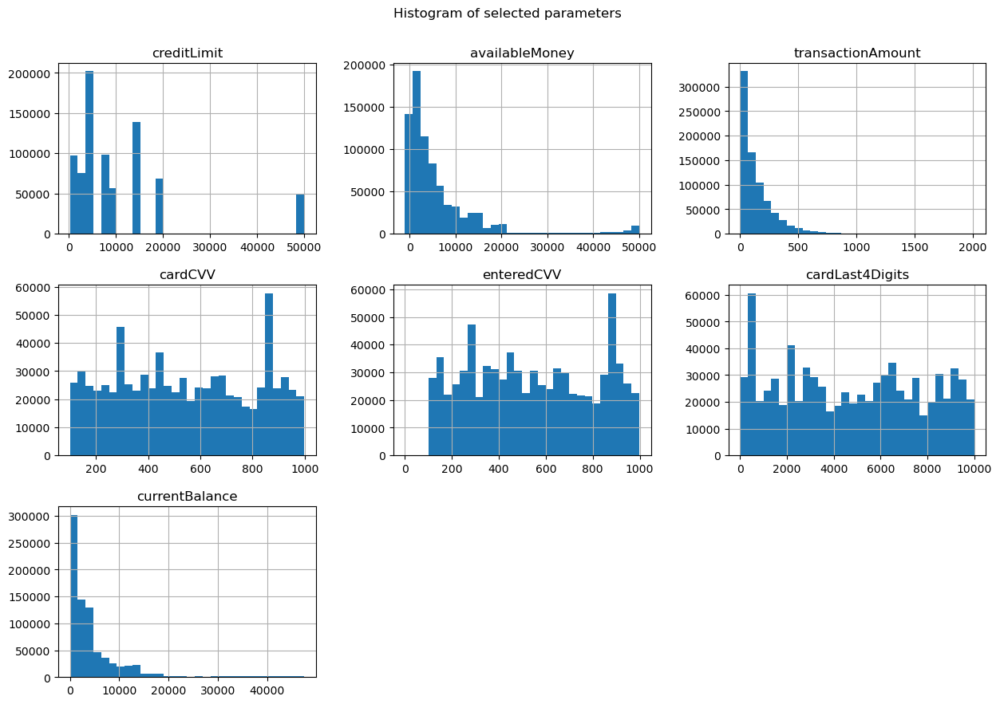

In [10]:
# Plot histogram of parameters
transactions[['creditLimit', 'availableMoney', 'transactionAmount', 'cardCVV', 'enteredCVV', 'cardLast4Digits', 'currentBalance']].hist(bins=30, figsize=(15, 10))
plt.suptitle('Histogram of selected parameters', y=0.95);

In [11]:
# describe numerical features
transactions.describe()

,accountNumber,customerId,creditLimit,availableMoney,transactionDateTime,transactionAmount,currentExpDate,accountOpenDate,dateOfLastAddressChange,cardCVV,enteredCVV,cardLast4Digits,currentBalance,transactionHour,transactionMinutes,transactionSeconds
count,7.863630e+05,7.863630e+05,786363.000000,786363.000000,786363,786363.000000,786363,786363,786363,786363.000000,786363.000000,786363.000000,786363.000000,786363.000000,786363.000000,786363.000000
mean,5.372326e+08,5.372326e+08,10759.464459,6250.724121,2016-07-06 01:58:58.395681536,136.985809,2026-09-25 23:50:42.724542720,2014-02-03 01:11:17.352825856,2015-04-14 06:46:41.127723520,544.467338,544.183857,4757.417799,4508.739258,11.511333,29.518682,29.510929
min,1.000881e+08,1.000881e+08,250.000000,-1005.630005,2016-01-01 00:01:02,0.000000,2019-12-01 00:00:00,1989-08-22 00:00:00,1989-08-22 00:00:00,100.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,3.301333e+08,3.301333e+08,5000.000000,1077.420044,2016-04-06 19:35:07,33.650002,2023-05-01 00:00:00,2013-06-29 00:00:00,2014-10-08 00:00:00,310.000000,310.000000,2178.000000,689.909973,6.000000,15.000000,15.000000
50%,5.074561e+08,5.074561e+08,7500.000000,3184.860107,2016-07-08 05:03:57,87.900002,2026-10-01 00:00:00,2014-09-05 00:00:00,2016-01-13 00:00:00,535.000000,535.000000,4733.000000,2451.760010,12.000000,30.000000,30.000000
75%,7.676200e+08,7.676200e+08,15000.000000,7500.000000,2016-10-05 13:52:03.500000,191.479996,2030-03-01 00:00:00,2015-05-04 00:00:00,2016-06-06 00:00:00,785.000000,785.000000,7338.000000,5291.094971,18.000000,45.000000,45.000000
max,9.993896e+08,9.993896e+08,50000.000000,50000.000000,2016-12-30 23:59:45,2011.540039,2033-08-01 00:00:00,2015-12-31 00:00:00,2016-12-30 00:00:00,998.000000,998.000000,9998.000000,47498.808594,23.000000,59.000000,59.000000
std,2.554211e+08,2.554211e+08,11636.174890,8879.510742,NaN,147.691971,NaN,NaN,NaN,261.524220,261.551254,2996.583810,6456.575684,6.921098,17.325778,17.315639


The chart above shows the histogram of selected variables. The plot of `availableMoney`, `transactionAmount`, and `currentBalance` are all **skewed left**. In `availableMoney` and `transactionAmount`, the peak is around the 0 mark. For `transactionAmount`, the spread of the data is from 0 to 2011 with a mean of 136.98 and a median at 87.9. Similarly, for `availableMoney`, the data is spread from -1005 to 50000 with a mean of 6250.72 and a median of 3184.86. By looking at the histogram, we can tell the data has significant outliers. 

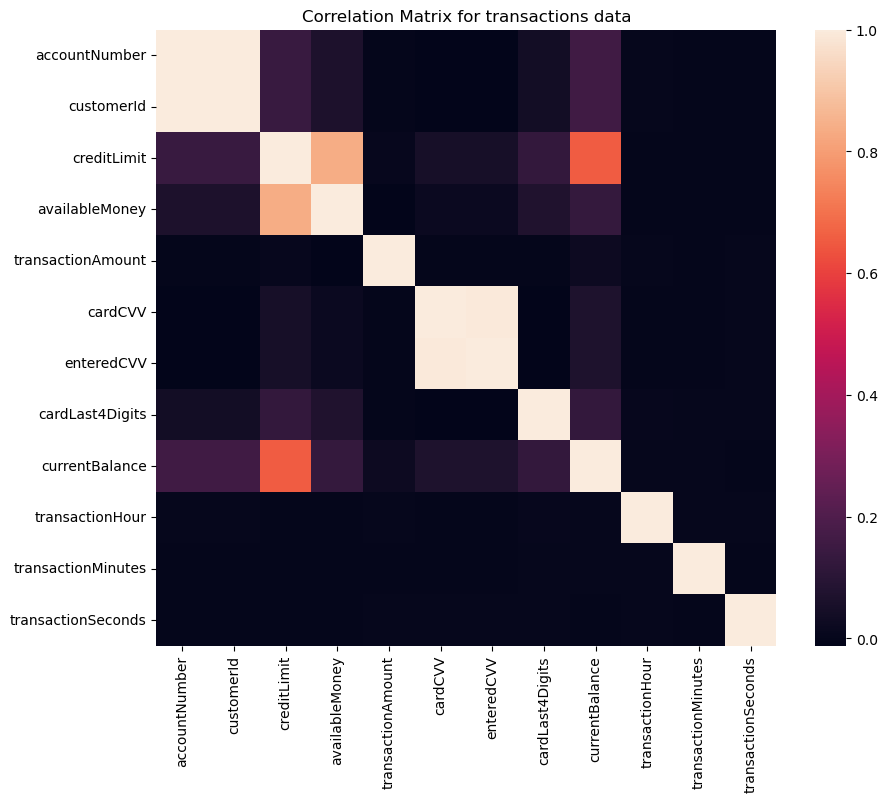

In [12]:
# correlation matrix
numeric_data = transactions.select_dtypes(include=['int64', 'int32', 'float64', 'float32'])
corr_matrix = numeric_data.corr()
plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix, annot=False)
plt.title('Correlation Matrix for transactions data')
plt.show()

<div id="question_two">
    <h3>Question 2: Plot</h3> 
</div>

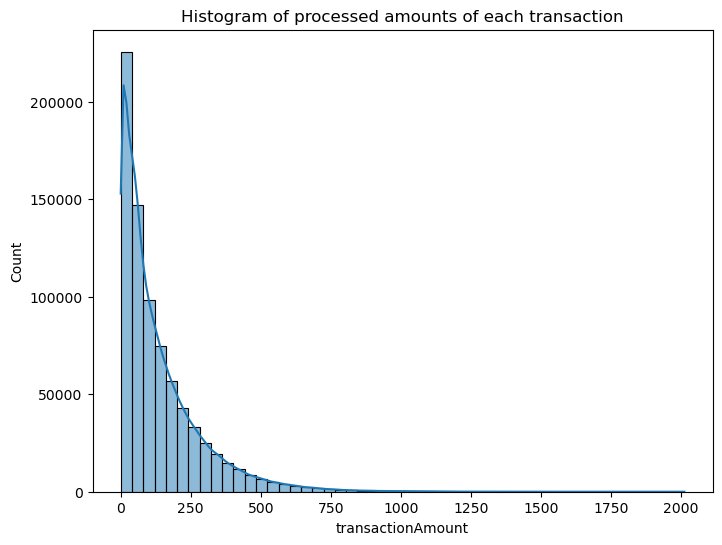

In [13]:
# histogram of the processed amounts of each transaction
fig, ax = plt.subplots(figsize=(8, 6))
sns.histplot(transactions, x='transactionAmount', kde=True, bins=50).set_title('Histogram of processed amounts of each transaction');

### Conclusion

The plot above shows the histogram of processed amounts of each transactions. For the `transactionAmount`, we noticed that there are 66038 distinct value representing 8.4% of that variable. The mean of the `transactionAmount` is 136.98 with a minimum value of 0, and a maximum at 2011.54. The minimum value of 0 suggests that there may be transactions with zero amounts, which could indicate refunds, reversals, or possibly errors in the data. The maximum value of 2011.54 indicates that there are transactions with relatively large amounts, potentially representing high-value purchases or transactions. The histogram is **left-skewed** indicating that there are more transactions with lower amount and fewer transactions with higher amount. Based on these observation, we hypothesize that there may be outliers in the dataset, seasonal or periodic patterns in transaction amounts, with certain times or periods (e.g., holidays, weekends, end of month) associated with higher or lower transaction amounts.

<div id="question_three">
    <h3>Question 3: Data Wrangling - Duplicate Transactions</h3> 
</div>

In [14]:
# various plotting function
def plot_snsbar(df, x, y, title):
    xlabel = str(x)
    ylabel = str(y)
    # create grouped data
    data = df.groupby([x])[y].count().sort_values(ascending=False).reset_index().head(20)
    fig, ax=plt.subplots(figsize=(12,6))
    ax = sns.barplot(x = x, y = y, data=data)
    ax.set_title(title, fontdict={'size':12})
    ax.set_ylabel(ylabel, fontsize = 10)
    ax.set_xlabel(xlabel, fontsize = 10)
    ax.set_xticklabels(data[x], rotation=90);

def pie_chart(df, title):
    labels = df.merchantCategoryCode.values.tolist()
    fracs = df.transactionAmount.values.tolist()
    # Create subplots and a pie chart
    my_explode_style = [0, 0.2, 0, 0.2, 0, 0.2, 0, 0.2, 0.2, 0, 0, 0.2, 0] 
    myexplode = [my_explode_style[i] for i in range(len(df))]
    font_color = '#525252'
    colors = ['#f7ecb0', '#ffb3e6', '#99ff99', '#66b3ff', '#c7b3fb','#ff6666', '#f9c3b7', '#b4ba32']
    fig, ax = plt.subplots(figsize=(15, 10), facecolor='#e8f4f0')
    ax.pie(fracs, labels=labels, 
           colors=colors, startangle=30, 
           textprops={'color':font_color}, 
           autopct='%1.1f%%', explode = myexplode, rotatelabels = True,
           shadow=True)
    # Set title, its position, and font size
    title = plt.title(title, fontsize=16, color=font_color)
    title.set_position([0.25, 1.05])

Let's perform data wrangling and preprocess the data in order to analyze the data. Looking through the `transactionAmount` column, we can see some duplicated transactions. We first filter out those transactions before manipulating them.

In [15]:
# identify reversed transaction
transactions['isDuplicated'] = (transactions.sort_values(['transactionDateTime'])
                                .groupby(['customerId', 'transactionAmount'], sort=False)['transactionDateTime']
                                .diff()
                                .dt.total_seconds()
                                .lt(120)
                               )

In [16]:
# check for duplicate transactions
transaction_duplicate = transactions.query('isDuplicated == True')
transaction_duplicate.head()

,accountNumber,customerId,creditLimit,availableMoney,transactionDateTime,transactionAmount,merchantName,acqCountry,merchantCountryCode,posEntryMode,...,transactionHour,transactionMinutes,transactionSeconds,currentExpMonth,currentExpDayofWeek,accountOpenMonth,accountOpenDayofWeek,dateOfLastAddressChangeMonth,dateOfLastAddressChangeDayofWeek,isDuplicated
133,984504651,984504651,50000,46367.410156,2016-01-16 09:53:15,450.739990,Planet Fitness #849960,US,US,05,...,9,53,15,August,Tuesday,July,Monday,July,Monday,True
263,984504651,984504651,50000,26680.990234,2016-03-12 06:34:29,118.519997,AMC #706324,US,US,02,...,6,34,29,October,Tuesday,July,Monday,July,Monday,True
281,984504651,984504651,50000,24316.119141,2016-03-18 13:57:04,26.709999,Planet Fitness #692929,US,US,02,...,13,57,4,October,Tuesday,July,Monday,July,Monday,True
339,984504651,984504651,50000,16503.490234,2016-04-08 22:21:11,43.209999,WSC #994275,US,US,02,...,22,21,11,February,Friday,July,Monday,March,Saturday,True
461,984504651,984504651,50000,13054.709961,2016-06-04 12:14:55,270.100006,EZ Putt Putt #40513,US,US,05,...,12,14,55,September,Tuesday,July,Monday,May,Thursday,True


In [17]:
# what type of purchases exist
transaction_duplicate.transactionType.unique()

array(['REVERSAL', 'PURCHASE', 'ADDRESS_VERIFICATION', ''], dtype=object)

In [18]:
# check for reversed transactionAmounts
n = ["REVERSAL"]
reversed_df = transaction_duplicate.loc[transaction_duplicate.transactionType.isin(n)]
reversed_df.shape

(3824, 41)

In [19]:
# total dollar amount reversed
reversal_amount = reversed_df.transactionAmount.sum()
print('The total number of transactions with reversal was {} transactions and the total dollar amount reversed was ${:.2f}'.format(reversed_df.shape[0], reversal_amount))

The total number of transactions with reversal was 3824 transactions and the total dollar amount reversed was $562291.88


Here we can see that *`3824`* transactions had a reversal and this amounted to a total dollar amount of *`$562,291.88`*. Let's check for multi-swipe transactions that occured.

In [20]:
# check for multi-swipe that occured
n = ['PURCHASE', 'ADDRESS_VERIFICATION', '']
multi_swipe_df = transaction_duplicate.loc[transaction_duplicate.transactionType.isin(n)]
multi_swipe_df.shape

(5058, 41)

In [21]:
# total count of multi-swipe
multi_swipe_count = multi_swipe_df.shape[0]

# total dollar amount for multi-swipe
multi_swipe_amount = multi_swipe_df['transactionAmount'].sum()

print('The total number of transactions with multi-swipe is {}, and total estimated dollar amount for the multi-swipe transactions is ${:.2f}'.format(multi_swipe_count, multi_swipe_amount))

The total number of transactions with multi-swipe is 5058, and total estimated dollar amount for the multi-swipe transactions is $742053.50


For multi-swipe transactions, we can see that *`5058`* transactions were multi-swiped and this amounted to a total dollar amount of *`$742,053.50`*. 

In [22]:
# top merchant with reversed transaction amounts
reversed_df.merchantName.value_counts().reset_index().rename(columns = {'index': 'merchantName', 'merchantName': 'Count'}).head(5)

,Count,count
0,Lyft,143
1,Uber,130
2,oldnavy.com,98
3,gap.com,97
4,amazon.com,96


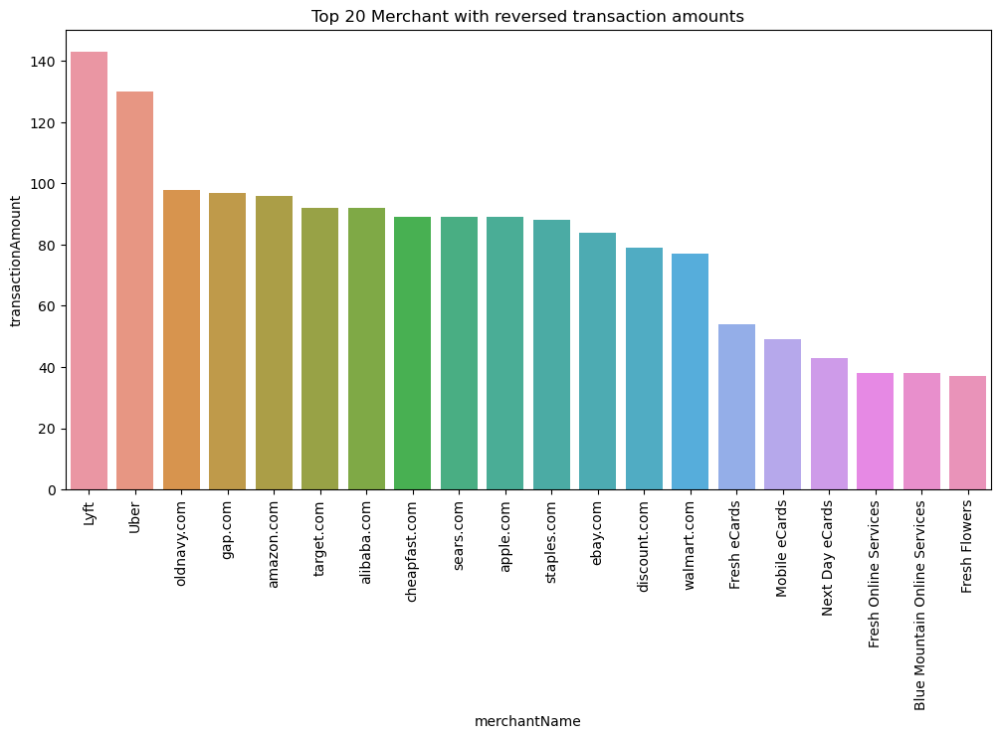

In [23]:
plot_snsbar(reversed_df, 'merchantName', 'transactionAmount', 'Top 20 Merchant with reversed transaction amounts')

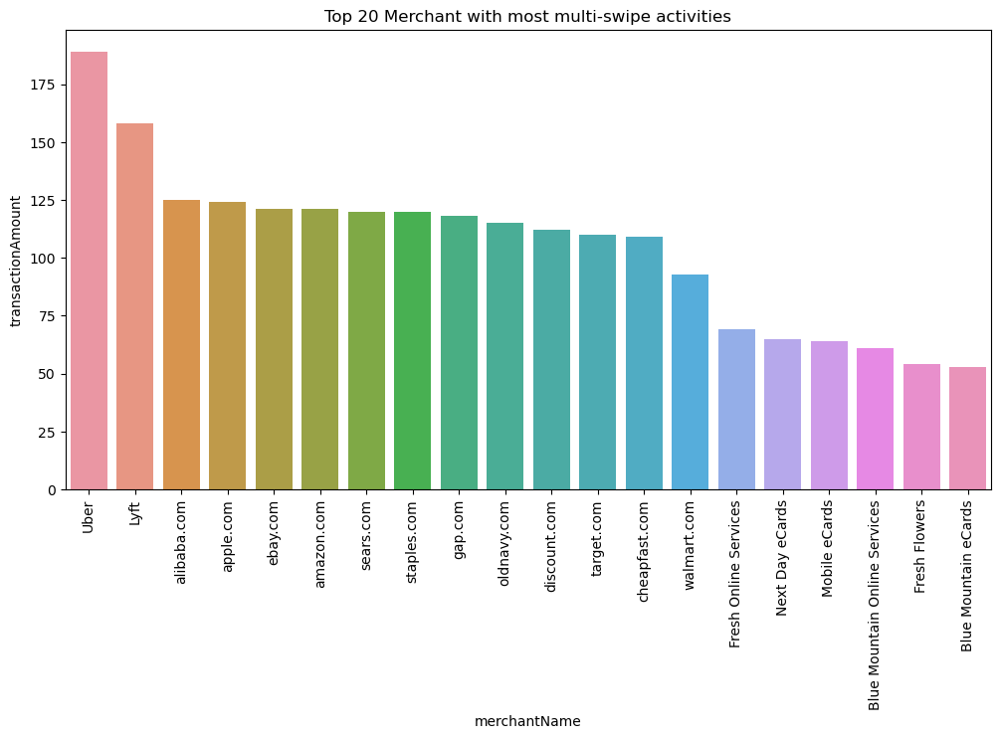

In [24]:
# top 20 merchant with most multi-swipe activities
plot_snsbar(multi_swipe_df, 'merchantName', 'transactionAmount', 'Top 20 Merchant with most multi-swipe activities')

From the above plots, we can see that `Lyft`, `Uber`, `Old Navy`, `Gap`, and `Amazon` were among the top five merchants with reversed transaction amount. Similarly, `Uber`, `Lyft`, `Alibaba.com`, `Apple`, and `Ebay` had the most multi-swipe activities occurring. 

### Drop multi-swipe transactions

In [25]:
# drop duplicated transactions from the data
rows = transaction_duplicate.index
card_transactions = transactions.drop(index = rows)
card_transactions.shape

(777481, 41)

In [26]:
# determine the number of fraud cases in the dataset
fraud = card_transactions[card_transactions['isFraud'] == True]
valid = card_transactions[card_transactions['isFraud'] == False]
print(f'The total number of fraudulent transactions are {len(fraud)} while the number of good transactions are {len(valid)}') 

The total number of fraudulent transactions are 12269 while the number of good transactions are 765212


### Analyze data

In [27]:
# check day of the week most fraud cases occur
fraud.transactionDayofWeek.value_counts().reset_index().rename(columns = {'index': 'transactionDayofWeek', 'transactionDayofWeek': 'Count'})

,Count,count
0,Friday,1847
1,Monday,1783
2,Wednesday,1763
3,Tuesday,1742
4,Thursday,1735
5,Sunday,1703
6,Saturday,1696


We can see that most fraudulent transactions took place on `Friday`, `Monday` and `Wednesday`. Although we should note that fraudulent activities are distributed evenly among the days of the week. Let's check the month with the most fraud taking place. 

In [28]:
# check month when most fraud cases occur
fraud.transactionMonth.value_counts().reset_index().rename(columns = {'index': 'transactionMonth', 'transactionMonth': 'Count'})

,Count,count
0,May,1071
1,January,1058
2,March,1049
3,July,1045
4,October,1040
5,June,1019
6,December,1018
7,August,1014
8,February,1008
9,September,1005


The month of `May`, `January` and `March` had the most fraudulent transactions occuring. 

In [29]:
# check top 20 merchant that had these fraudulent activities
fraud.merchantName.value_counts().reset_index().rename(columns = {'index': 'merchantName', 'merchantName': 'Count'}).head(20)

,Count,count
0,Lyft,749
1,ebay.com,629
2,Fresh Flowers,550
3,Uber,509
4,walmart.com,442
5,cheapfast.com,434
6,sears.com,419
7,oldnavy.com,398
8,staples.com,396
9,alibaba.com,381


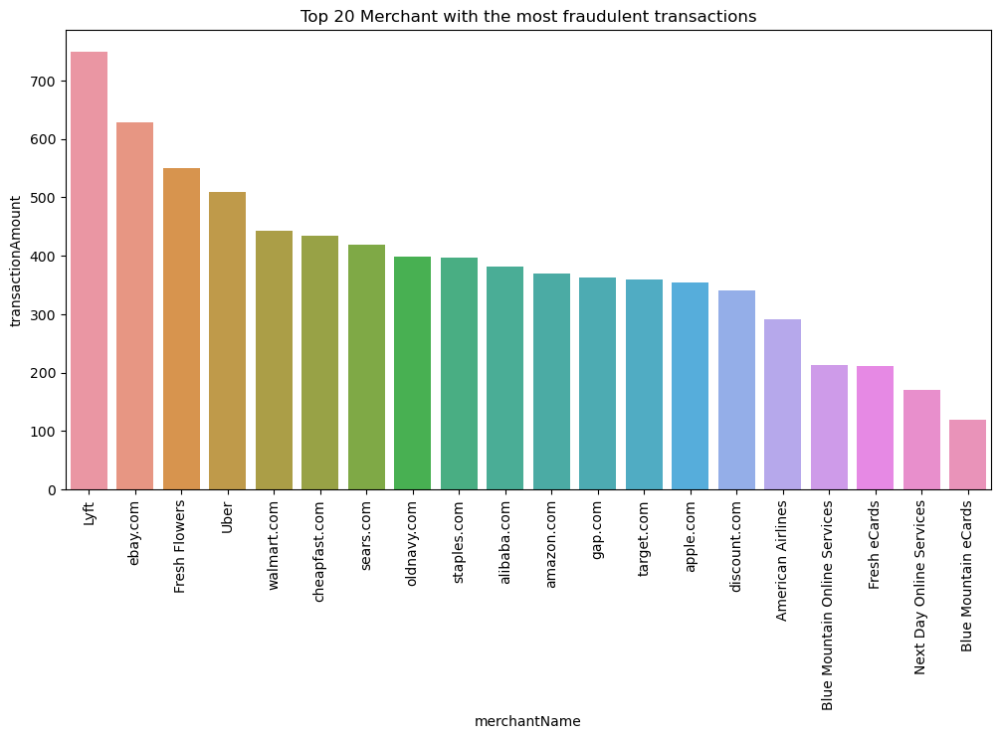

In [30]:
# count of fraudulent activities across merchants
plot_snsbar(fraud, 'merchantName', 'transactionAmount', 'Top 20 Merchant with the most fraudulent transactions')

The plot above shows the top 20 merchants with the most fraudulent activities occuring.

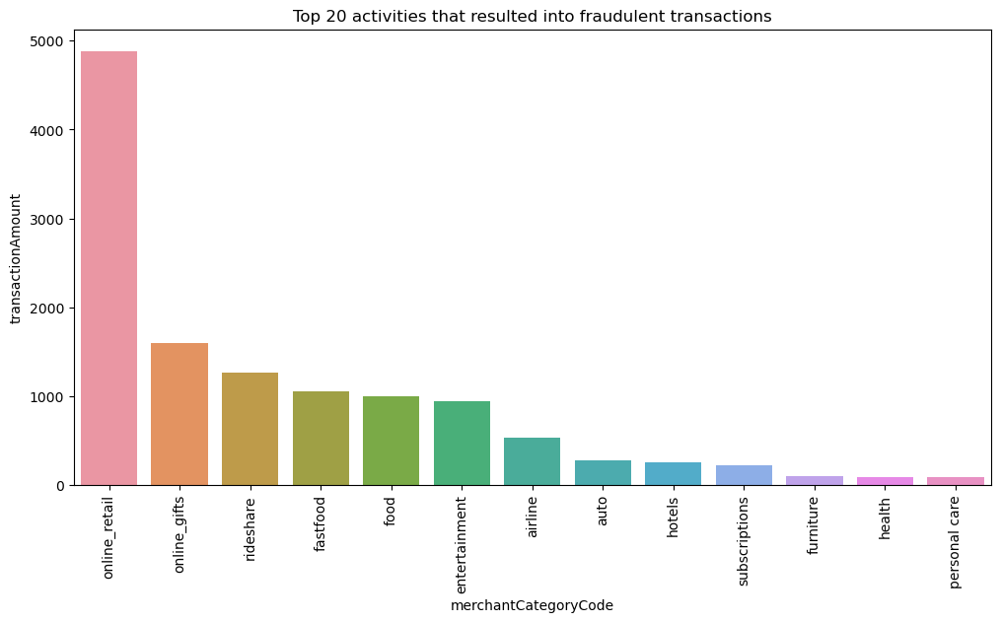

In [31]:
# what activities took place when these frauds occured
plot_snsbar(fraud, 'merchantCategoryCode', 'transactionAmount', 'Top 20 activities that resulted into fraudulent transactions')

The chart above shows the activities that took place when these fraudulent activities occured. We can see that `online retail`, `online gifts`, `rideshare`, `fastfood`, `food`, and `entertainment` accounted for the top activities that usually resulted in a fraudulent transactions.

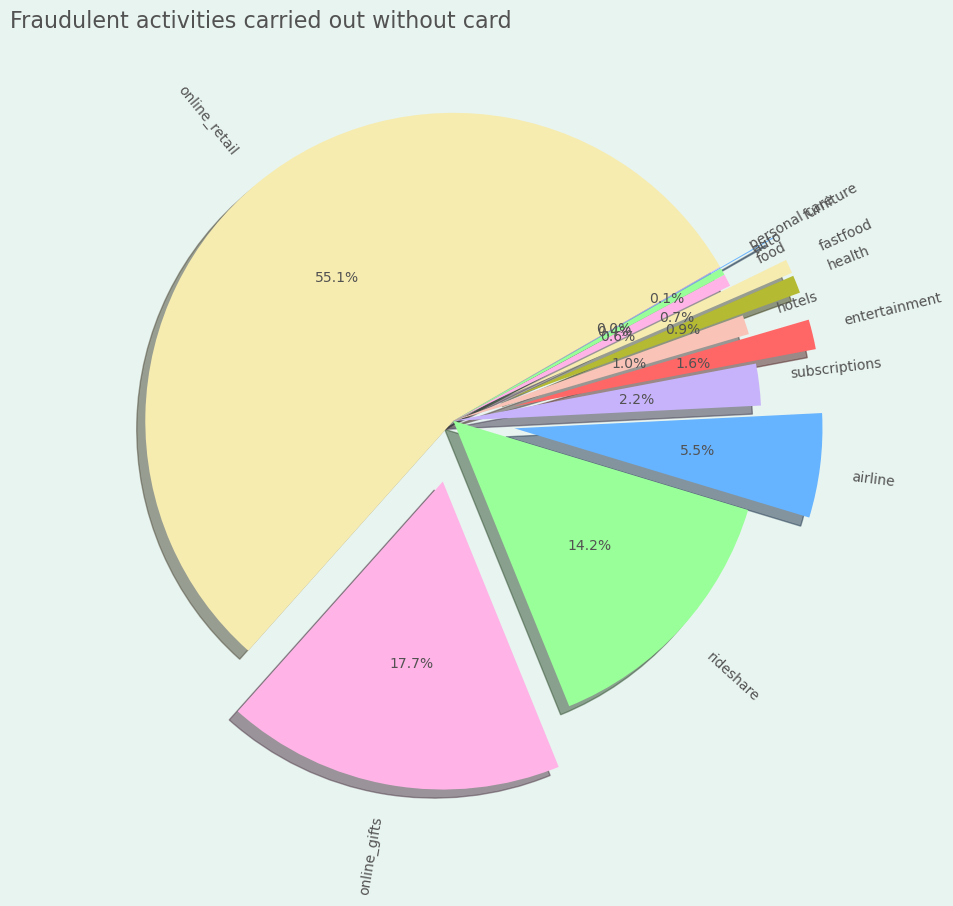

In [32]:
# pie chart showing fraud activity carried out without card presnt
merchant_fraud_agg = fraud[['merchantCategoryCode', 'cardPresent', 'transactionAmount']]
merchant_fraud_agg_without_card = merchant_fraud_agg[merchant_fraud_agg['cardPresent'] == False]
merchant_fraud_without_card_present = merchant_fraud_agg_without_card.groupby(['merchantCategoryCode'])['transactionAmount'].count().reset_index().sort_values(by='transactionAmount', ascending = False).reset_index(drop = True)
pie_chart(merchant_fraud_without_card_present, 'Fraudulent activities carried out without card')

The pie chart above shows the fraction of fraudulent activities that was carried out without the card being present. `Online retail` and `online gifts` accounted for the most representation.

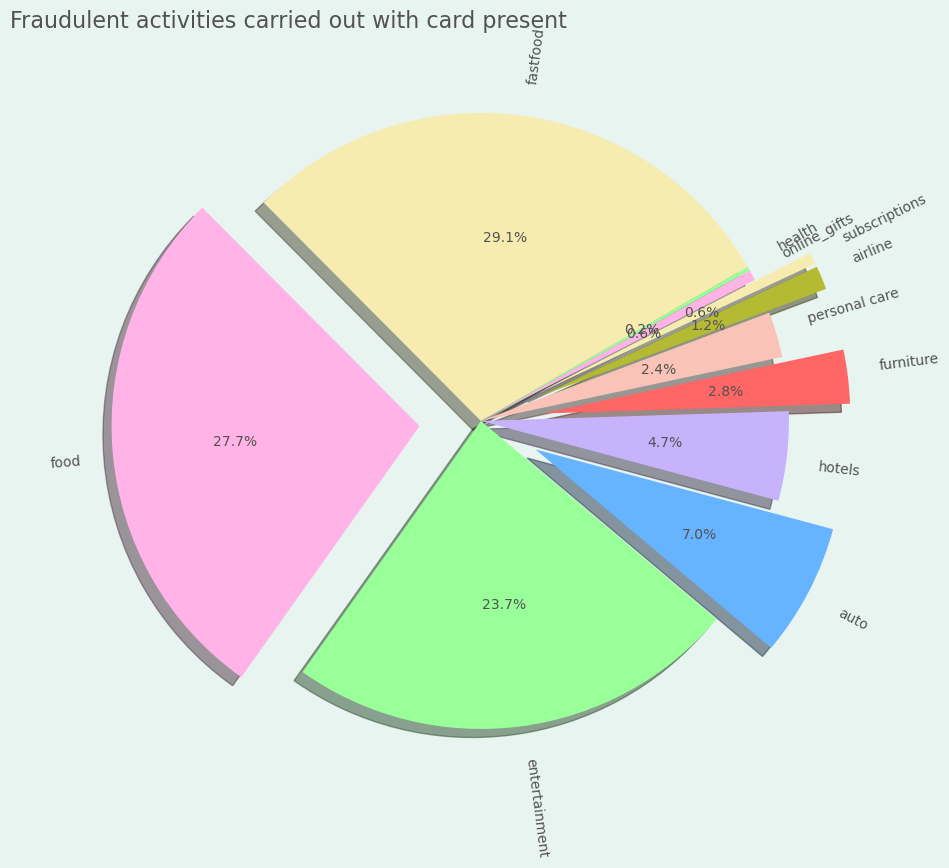

In [33]:
# pie chart showing fraud activity carried out with card presnt
merchant_fraud_agg = fraud[['merchantCategoryCode', 'cardPresent', 'transactionAmount']]
merchant_fraud_agg_with_card = merchant_fraud_agg[merchant_fraud_agg['cardPresent'] == True]
merchant_fraud_with_card_present = merchant_fraud_agg_with_card.groupby(['merchantCategoryCode'])['transactionAmount'].count().reset_index().sort_values(by='transactionAmount', ascending = False).reset_index(drop = True)
pie_chart(merchant_fraud_with_card_present, 'Fraudulent activities carried out with card present')

The pie chart above shows the fraction of fraudulent activities that was carried out with the card being present. `Fast food`, `food` and `entertainment` accounted for the most representation.

### Conclusion

In this section, we explored the data in order to derive insight from the data. We plotted a histogram of `transactionAmount` and noticed that the plot is *skewed left* with the spread of the data from 0 to 2011 with a mean of 136.98 and a median at 87.9. On further exploration of the data, `3824` transactions had a reversal and this amounted to a total dollar amount of `$562,291.88`. About `5058` transactions were multi-swiped and this amounted to a total dollar amount of `$742,053.50`. We noted that most fraudulent transactions took place on `Friday`, `Monday` and `Wednesday` and the months of `May`, `January` and `March` were the top three months where the most fraudulent transactions occured.

We decided to locate the merchants with the most reversed transaction. We observe that `Lyft`, `Uber`, `Old Navy`, `Gap`, and `Amazon` were among the top five merchants with reversed transaction amount. Similarly, `Uber`, `Lyft`, `Alibaba.com`, `Apple`, and `Ebay` had the most multi-swipe activities occurring. We observed activities that took place when these fraudulent activities occured and noticed that `online retail`, `online gifts`, `rideshare`, `fastfood`, `food`, and `entertainment` accounted for the top activities that usually resulted in a fraudulent transactions. The fraction of fraudulent activities that was carried out without the card being present shows that `Online retail` and `online gifts` accounted for the most frauds. Also, the fraction of fraudulent activities that was carried out with the card present shows that `fast food`, `food` and `entertainment` accounted for the most representation.

Intuitively, we can deduce from the data that most of the fraud being carried out without the card present could represent real fraud that would lead to losses for CapitalOne because you really need your card present to make purchases online. One way to prevent this type of online fraud would be to prevent online transaction from going through if the card is not present with the owner.

<div id="modeling_process">
    <h2>Modeling Process</h2> 
</div>

<div id="question_four">
    <h3>Question 4: Model</h3> 
</div>

Here, we would train different models. We would be training a couple of tree-based models, gradient-boosted model and leaf-based model. The primary metric we chose to evaluate the model is AUC-ROC. The secondary metric is accuracy. AUC computes the area under the curve and the objective is to **maximize** this area. Accuracy tells us how often the classifier is correct and the objective is to **maximize** accuracy. 

### Feature Engineering for Machine Learning

We perform feature engineering to encode all categorical features to numeric. Encoding features makes them useful for machine learning. We would be applying one-hot encoding, target encoding and ordinal encoding depending on the machine learning algorithm. A summary of the result is shown here.

| Model type | Model | Encoding type | Highlight | Cons |
|:--- |:----|:---:|:---:| :--- |
| Statistical based| Logistic regression | One-hot encoding | Less prone to over-fitting and easily explainable | Can overfit in high dimensional datasets |
| Tree-based | Decision Tree | label encoding | Normalization or scaling of data not needed  | Prone to overfitting   |
|            | Random Forest | label encoding | Excellent predictive powers| Prone to overfitting   |
| Gradient-boosted | Catboost      | No encoding    | Can handle categorical data well |  Needs to build deep decision trees in features with high cardinality |
| Gradient boosted | XGBoost | One-hot encoding | Good execution and model performance | Cannot handle categorical features (need encoding) |
| Gradient-boosted | LightGBM | Ordinal encoding | Extremely fast | Needs encoding for categorical features    |

For ease of modeling, we would use OrdinalEncoder for features with high cardinality and OneHotEncoder for features with low cardinality. We chose this approach to avoid problems associated with the curse of dimensionality. Since the CatBoost regressor has its own implementation for encoding of categorical features, we create a separate dataset without any encoding. Internally, catboost encodes the categorical features. Since one-hot encoding is not optimal for the LightGBM since it does its own encoding for categorical features, we apply OrdinalEncoder on the categorical features of LightGBM.

In [34]:
# create new data copy for modeling
transactions_df = card_transactions.copy()

# drop unimportant features
transactions_df = transactions_df.drop(['transactionDateTime', 'currentExpDate', 'accountOpenDate', 'dateOfLastAddressChange', 'cardCVV', 'enteredCVV', 
                                        'cardLast4Digits', 'echoBuffer', 'merchantCity', 'merchantState', 'merchantZip', 'posOnPremises', 'recurringAuthInd', 'isDuplicated'], axis=1)

# encode some features
transactions_df['expirationDateKeyInMatch'] = transactions_df['expirationDateKeyInMatch'].replace({True: 1, False: 0})
transactions_df['cardPresent'] = transactions_df['cardPresent'].replace({True: 1, False: 0})
transactions_df['isFraud'] = transactions_df['isFraud'].replace({True: 1, False: 0})

# create copy of dataset for CatBoost algorithm 
card_transactions_catBoost = transactions_df.copy()

# create features and target
features = transactions_df.drop(['isFraud'], axis = 1)
target = transactions_df.isFraud

### Preprocessing Pipeline

In [35]:
# Get numerical and categorical features
cat_feature_cols = [cname for cname in features.columns if features[cname].dtype == "object"]
num_feature_cols = [cname for cname in features.columns if features[cname].dtype in ["int64", "int32", "float64", "float32"]] 

# preprocessing pipelines
num_pipeline = Pipeline(
    steps=[("scaler", StandardScaler())
    ]
)

cat_pipeline = Pipeline(
    steps=[('encoding', OrdinalEncoder())
    ]
)

preprocessor = ColumnTransformer(
    transformers=[
        ("num_pipeline", num_pipeline, num_feature_cols),
        ("cat_pipeline", cat_pipeline, cat_feature_cols)
        ]
    )

# show preprocessor pipeline
set_config(display="diagram")
display(preprocessor)

ColumnTransformer(transformers=[('num_pipeline',
                                 Pipeline(steps=[('scaler', StandardScaler())]),
                                 ['accountNumber', 'customerId', 'creditLimit',
                                  'availableMoney', 'transactionAmount',
                                  'currentBalance', 'cardPresent',
                                  'expirationDateKeyInMatch', 'transactionHour',
                                  'transactionMinutes', 'transactionSeconds']),
                                ('cat_pipeline',
                                 Pipeline(steps=[('encoding',
                                                  OrdinalEncoder())]),
                                 ['merchantName', 'acqCountry',
                                  'merchantCountryCode', 'posEntryMode',
                                  'posConditionCode', 'merchantCategoryCode',
                                  'transactionType', 'transactionMonth',
                                  'transactionDayofWeek', 'currentExpMonth',
                                  'currentExpDayofWeek', 'accountOpenMonth',
                                  'accountOpenDayofWeek',
                                  'dateOfLastAddressChangeMonth',
                                  'dateOfLastAddressChangeDayofWeek'])])

In [36]:
# Apply all the stages of transformation to the data
preprocessed_data = preprocessor.fit_transform(features)

# Get feature names after transformation
preprocessed_features = pd.DataFrame(preprocessed_data, columns=num_feature_cols + cat_feature_cols)
preprocessed_features.head()

,accountNumber,customerId,creditLimit,availableMoney,transactionAmount,currentBalance,cardPresent,expirationDateKeyInMatch,transactionHour,transactionMinutes,...,merchantCategoryCode,transactionType,transactionMonth,transactionDayofWeek,currentExpMonth,currentExpDayofWeek,accountOpenMonth,accountOpenDayofWeek,dateOfLastAddressChangeMonth,dateOfLastAddressChangeDayofWeek
0,0.783228,0.783228,-0.494911,-0.141113,-0.259535,-0.697916,-0.902098,-0.036493,0.359682,-0.145410,...,17.0,2.0,1.0,2.0,6.0,4.0,7.0,2.0,7.0,2.0
1,0.783228,0.783228,-0.494911,-0.141113,-0.422341,-0.697916,1.108527,-0.036493,-0.940691,-1.415129,...,3.0,2.0,10.0,5.0,3.0,4.0,7.0,2.0,7.0,2.0
2,0.783228,0.783228,-0.494911,-0.141113,-0.876356,-0.697916,-0.902098,-0.036493,-0.362747,-0.664840,...,12.0,2.0,9.0,5.0,1.0,0.0,7.0,2.0,7.0,2.0
3,0.783228,0.783228,-0.494911,-0.141113,-0.876356,-0.697916,-0.902098,-0.036493,-1.374148,-0.895698,...,12.0,2.0,2.0,2.0,1.0,0.0,7.0,2.0,7.0,2.0
4,1.147577,1.147577,-0.494911,-0.141113,-0.444893,-0.697916,1.108527,-0.036493,1.371083,-1.472843,...,4.0,2.0,7.0,4.0,10.0,1.0,1.0,4.0,1.0,4.0


### Split data into 60% training, 20% validation and 20% testing sets

Here we split the data into training, validation and testing sets in the ratio 60:20:20 respectively.

In [37]:
# split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(preprocessed_features, target, test_size=0.20, random_state=12345)

# split train data into validation and train 
X_train, X_valid, y_train, y_valid = train_test_split(X_train, y_train, test_size = 0.25, random_state = 12345) # 0.25 * 0.80 = 0.20 for validation size

# display the shape of the split dataset
print('The train set now contains {}'.format(X_train.shape[0]) + ' dataset representing 60% of the data') 
print('The valid set now contains {}'.format(X_valid.shape[0]) + ' dataset representing 20% of the data')
print('The test set now contains {}'.format(X_test.shape[0]) + ' dataset representing 20% of the data')

The train set now contains 466488 dataset representing 60% of the data
The valid set now contains 155496 dataset representing 20% of the data
The test set now contains 155497 dataset representing 20% of the data


### Conclusion

We split the data into 60% training, 20% validation and 20% testing sets. We did this because we had a lot of data and validating the model is equally as important as training the model. We applied ordinal encoding to encode the categorical features. We scaled the data after encoding using the standard scaler function. Next we are going to examine class imbalance and apply some oversampling techniques to improve the model performance if class imbalance exist.

### Examine Class imbalance

In [38]:
# function to calculate model evaluation metrics
def print_model_evaluation(y_test, test_predictions):
    print("\033[1m" + 'F1 score: ' + "\033[0m", '{:.3f}'.format(f1_score(y_test, test_predictions)))
    print("\033[1m" + 'Accuracy Score: ' + "\033[0m", '{:.2%}'.format(accuracy_score(y_test, test_predictions)))
    print("\033[1m" + 'Precision: ' + "\033[0m", '{:.3f}'.format(precision_score(y_test, test_predictions)))
    print("\033[1m" + 'Recall: ' + "\033[0m", '{:.3f}'.format(recall_score(y_test, test_predictions)))
    print("\033[1m" + 'Balanced Accuracy Score: ' + "\033[0m", '{:.2%}'.format(balanced_accuracy_score(y_test, test_predictions)))
    print("\033[1m" + 'AUC-ROC Score: ' + "\033[0m", '{:.2%}'.format(roc_auc_score(y_test, test_predictions)))
    print()
    print("\033[1m" + 'Confusion Matrix' + "\033[0m")
    print('-'*50)
    print(confusion_matrix(y_test, test_predictions))
    print()
    print("\033[1m" + 'Classification report' + "\033[0m")
    print('-'*50)
    print(classification_report(y_test, test_predictions))
    print()

In [39]:
# function to evaluate classification models
def evaluate_model(model, train_features, train_target, test_features, test_target):
    
    eval_stats = {}
    
    fig, axs = plt.subplots(1, 3, figsize=(20, 6)) 
    
    for type, features, target in (('train', train_features, train_target), ('test', test_features, test_target)):
        
        eval_stats[type] = {}
    
        pred_target = model.predict(features)
        pred_proba = model.predict_proba(features)[:, 1]
        
        # F1
        f1_thresholds = np.arange(0, 1.01, 0.05)
        f1_scores = [metrics.f1_score(target, pred_proba>=threshold) for threshold in f1_thresholds]
        
        # ROC
        fpr, tpr, roc_thresholds = metrics.roc_curve(target, pred_proba)
        roc_auc = metrics.roc_auc_score(target, pred_proba)    
        eval_stats[type]['ROC AUC'] = roc_auc

        # PRC
        precision, recall, pr_thresholds = metrics.precision_recall_curve(target, pred_proba)
        aps = metrics.average_precision_score(target, pred_proba)
        eval_stats[type]['APS'] = aps
        
        if type == 'train':
            color = 'blue'
        else:
            color = 'green'

        # F1 Score
        ax = axs[0]
        max_f1_score_idx = np.argmax(f1_scores)
        ax.plot(f1_thresholds, f1_scores, color=color, label=f'{type}, max={f1_scores[max_f1_score_idx]:.2f} @ {f1_thresholds[max_f1_score_idx]:.2f}')
        # setting crosses for some thresholds
        for threshold in (0.2, 0.4, 0.5, 0.6, 0.8):
            closest_value_idx = np.argmin(np.abs(f1_thresholds-threshold))
            marker_color = 'orange' if threshold != 0.5 else 'red'
            ax.plot(f1_thresholds[closest_value_idx], f1_scores[closest_value_idx], color=marker_color, marker='X', markersize=7)
        ax.set_xlim([-0.02, 1.02])    
        ax.set_ylim([-0.02, 1.02])
        ax.set_xlabel('threshold')
        ax.set_ylabel('F1')
        ax.legend(loc='lower center')
        ax.set_title(f'F1 Score') 

        # ROC
        ax = axs[1]    
        ax.plot(fpr, tpr, color=color, label=f'{type}, ROC AUC={roc_auc:.2f}')
        # setting crosses for some thresholds
        for threshold in (0.2, 0.4, 0.5, 0.6, 0.8):
            closest_value_idx = np.argmin(np.abs(roc_thresholds-threshold))
            marker_color = 'orange' if threshold != 0.5 else 'red'            
            ax.plot(fpr[closest_value_idx], tpr[closest_value_idx], color=marker_color, marker='X', markersize=7)
        ax.plot([0, 1], [0, 1], color='grey', linestyle='--')
        ax.set_xlim([-0.02, 1.02])    
        ax.set_ylim([-0.02, 1.02])
        ax.set_xlabel('FPR')
        ax.set_ylabel('TPR')
        ax.legend(loc='lower center')        
        ax.set_title(f'ROC Curve')
        
        # PRC
        ax = axs[2]
        ax.plot(recall, precision, color=color, label=f'{type}, AP={aps:.2f}')
        # setting crosses for some thresholds
        for threshold in (0.2, 0.4, 0.5, 0.6, 0.8):
            closest_value_idx = np.argmin(np.abs(pr_thresholds-threshold))
            marker_color = 'orange' if threshold != 0.5 else 'red'
            ax.plot(recall[closest_value_idx], precision[closest_value_idx], color=marker_color, marker='X', markersize=7)
        ax.set_xlim([-0.02, 1.02])    
        ax.set_ylim([-0.02, 1.02])
        ax.set_xlabel('recall')
        ax.set_ylabel('precision')
        ax.legend(loc='lower center')
        ax.set_title(f'PRC')        

        eval_stats[type]['Accuracy'] = metrics.accuracy_score(target, pred_target)
        eval_stats[type]['F1'] = metrics.f1_score(target, pred_target)
    
    df_eval_stats = pd.DataFrame(eval_stats)
    df_eval_stats = df_eval_stats.round(2)
    df_eval_stats = df_eval_stats.reindex(index=('Accuracy', 'F1', 'APS', 'ROC AUC'))
    
    print(df_eval_stats)
    
    return

#### Baseline Model

In [40]:
# baseline model using a dummy classifier
dummy_clf = DummyClassifier(strategy="most_frequent")
dummy_clf.fit(X_train, y_train)
dummy_clf_valid_predictions = dummy_clf.predict(X_valid)

In [41]:
# evaluate baseline model
print_model_evaluation(y_valid, dummy_clf_valid_predictions)

F1 score:  0.000
Accuracy Score:  98.43%
Precision:  0.000
Recall:  0.000
Balanced Accuracy Score:  50.00%
AUC-ROC Score:  50.00%

Confusion Matrix
--------------------------------------------------
[[153058      0]
 [  2438      0]]

Classification report
--------------------------------------------------
              precision    recall  f1-score   support

           0       0.98      1.00      0.99    153058
           1       0.00      0.00      0.00      2438

    accuracy                           0.98    155496
   macro avg       0.49      0.50      0.50    155496
weighted avg       0.97      0.98      0.98    155496




The baseline model predicts the most frequent class in this case to be "0". Looking at the baseline model report, we can see that the accuracy is high at 98.42% and the AUC-ROC score is 50%. This represents the baseline so we should expect our models to perform better. We need to balance the classes to improve on the model's performance. Let's perform a sanity check using Logistic regression.

#### Sanity check with Logistic regression

0    0.999968
1    0.000032
Name: proportion, dtype: float64

Accuracy score before upsampling: 0.984


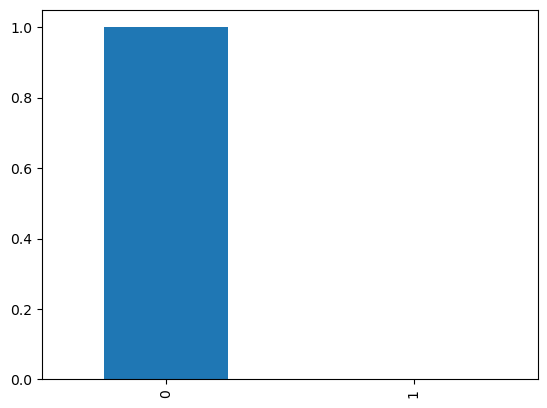

In [42]:
# sanity check
model = LogisticRegression(random_state=12345, solver='liblinear')
model.fit(X_train, y_train) # train the model 
valid_predictions = pd.Series(model.predict(X_valid))
class_frequency = valid_predictions.value_counts(normalize=True)
print(class_frequency)
class_frequency.plot(kind='bar');
print()
print('Accuracy score before upsampling: {:.3f}'.format(accuracy_score(y_valid, valid_predictions)))

We assess the sanity of the model by checking how often the target feature contains the class "1" or "0". We can observe the class imbalance in the predicted validation set. Next we try to improve the quality of the model using the upsampling approaches or applying SMOTE to fix class imbalance. Since the classes are highly imbalanced, we would use the ROC-AUC, Log loss and F1 score as our metric of choice. 

### 

### Fix Class Imbalance

isFraud
0    459093
1      7395
Name: count, dtype: int64


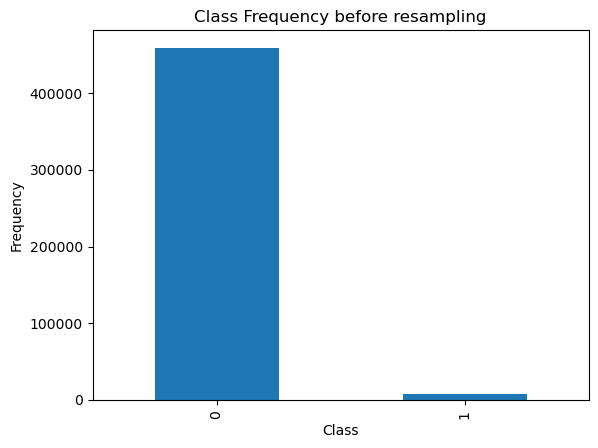

In [43]:
# Check class distribution
class_frequency = y_train.value_counts() #(normalize = True)
print(class_frequency)
class_frequency.plot(kind='bar')
plt.title('Class Frequency before resampling')
plt.xlabel('Class')
plt.ylabel('Frequency')
plt.show()

In [44]:
# Random Over-Sampling with Imblearn
oversample = RandomOverSampler(sampling_strategy="all", random_state=42)
X_train_oversample, y_train_oversample = oversample.fit_resample(X_train, y_train)
print("Original dataset shape", Counter(y_train))
print("Resampled dataset shape", Counter(y_train_oversample))

Original dataset shape Counter({0: 459093, 1: 7395})
Resampled dataset shape Counter({0: 459093, 1: 459093})


isFraud
0    459093
1    459093
Name: count, dtype: int64


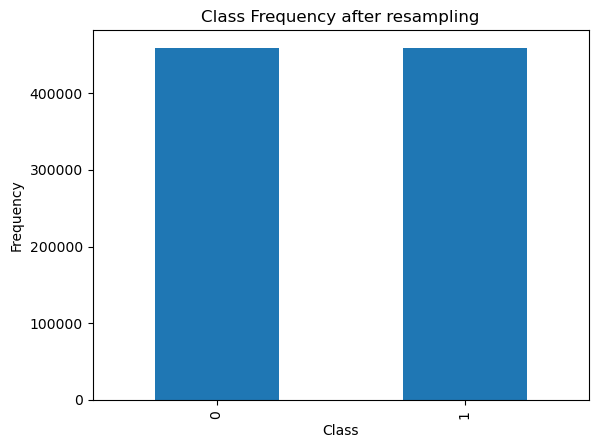

In [45]:
# Check class distribution after resampling
class_frequency = y_train_oversample.value_counts() #(normalize = True)
print(class_frequency)
class_frequency.plot(kind='bar')
plt.title('Class Frequency after resampling')
plt.xlabel('Class')
plt.ylabel('Frequency')
plt.show()

This wasn't too bad. We have been able to balance the class. Now it's time to build our model.

<div id="model_training">
    <h2>Model Training</h2> 
</div>

In [46]:
# function to plot confusion matrix
def plot_confusion_matrix(y, y_predict):
    "Plots the confusion matrix"
    cm = confusion_matrix(y, y_predict)
    ax= plt.subplot()
    sns.heatmap(cm, annot=True, ax = ax, fmt='g'); #annot=True to annotate cells
    ax.set_xlabel('Predicted labels')
    ax.set_ylabel('True labels')
    ax.set_title('Confusion Matrix'); 
    ax.xaxis.set_ticklabels(['is not Fraud', 'isFraud']); ax.yaxis.set_ticklabels(['is not Fraud', 'isFraud'])

# Get model performance score
def get_scores(y_test, y_pred, model):
    # determine AUC-ROC score
    print("\033[1m" + 'Measure model performance using {} Classifier'.format(model) + "\033[0m")
    print('ROC-AUC Score: {:.3f}'.format(roc_auc_score(y_test, y_pred[1], multi_class='ovr')))
    print('Log loss is: {:.3f}'.format(log_loss(y_test, y_pred[1])))
    print('F1 score: {:.3f}'.format(f1_score(y_test, y_pred[0], average="weighted")))

def shap_feature_importance(model_name, model, X_train):
    # compute SHAP values
    shap.initjs()
    explainer = shap.TreeExplainer(model)
    shap_values = explainer.shap_values(X_train, approximate = False)

    shap.summary_plot(shap_values, X_train.values, show = False, plot_type="bar", class_names = model.classes_, feature_names = X_train.columns) 
    fig, ax = plt.gcf(), plt.gca()
    fig.set_size_inches(8, 6)

    # Modifying main plot parameters
    ax.tick_params(labelsize=14)
    ax.set_xlabel("SHAP value (impact on model output)", fontsize=10)
    ax.set_title('Feature Importance - {} model on features'.format(model_name), fontsize=12)

    # Modifying color bar parameters
    ax.tick_params(labelsize=10)
    ax.set_ylabel("Feature value", fontsize=10)
    plt.show()




#### Logistic Regression

In [47]:
%%time

# define hyperparameters to tune 
grid_logreg = {
    "C": [0.01, 0.1, 1],
    'penalty': ['l2'], # l1 lasso l2 ridge
    'solver': ['lbfgs']
}
kfold = StratifiedKFold(n_splits=3, shuffle=True, random_state=42)

# define the model
logreg_clf = LogisticRegression(random_state = 12345)
# define the grid search object
grid_search_logreg = GridSearchCV(
    estimator = logreg_clf,
    param_grid = grid_logreg,
    scoring = 'roc_auc',
    cv = kfold
)
# execute search
logreg_cv = grid_search_logreg.fit(X_train_oversample, y_train_oversample)
# summarize result
print('The best hyperparameters are: {}'.format(logreg_cv.best_params_))

The best hyperparameters are: {'C': 1, 'penalty': 'l2', 'solver': 'lbfgs'}
CPU times: user 4min 8s, sys: 3min 31s, total: 7min 39s
Wall time: 45.5 s


In [48]:
# train model and make predictions
def train_logistic_regression_classifier(X_train, y_train):
    """This function trains a logistic regression classifier"""
    # build the model
    logreg_model = LogisticRegression(**grid_search_logreg.best_params_)
    logreg_model.fit(X_train, y_train) # train the model 
    return logreg_model
    
def logistic_regression_classifier_prediction(X_train, y_train, X_test, y_test):
    """
    This function is used to make prediction 
    using a logistic regression classification model
    """
    logreg_model = train_logistic_regression_classifier(X_train, y_train)
    logreg_pred = logreg_model.predict(X_test)
    logreg_pred_proba = logreg_model.predict_proba(X_test)[:, 1]
    return logreg_pred, logreg_pred_proba

In [49]:
%%time

# train classifier and make prediction
logreg_pred = logistic_regression_classifier_prediction(X_train_oversample, y_train_oversample, X_test, y_test)

# get predictions
get_scores(y_test, logreg_pred, "Logistic regression")

Measure model performance using Logistic regression Classifier
ROC-AUC Score: 0.694
Log loss is: 0.638
F1 score: 0.808
CPU times: user 33.5 s, sys: 26.5 s, total: 60 s
Wall time: 6.38 s


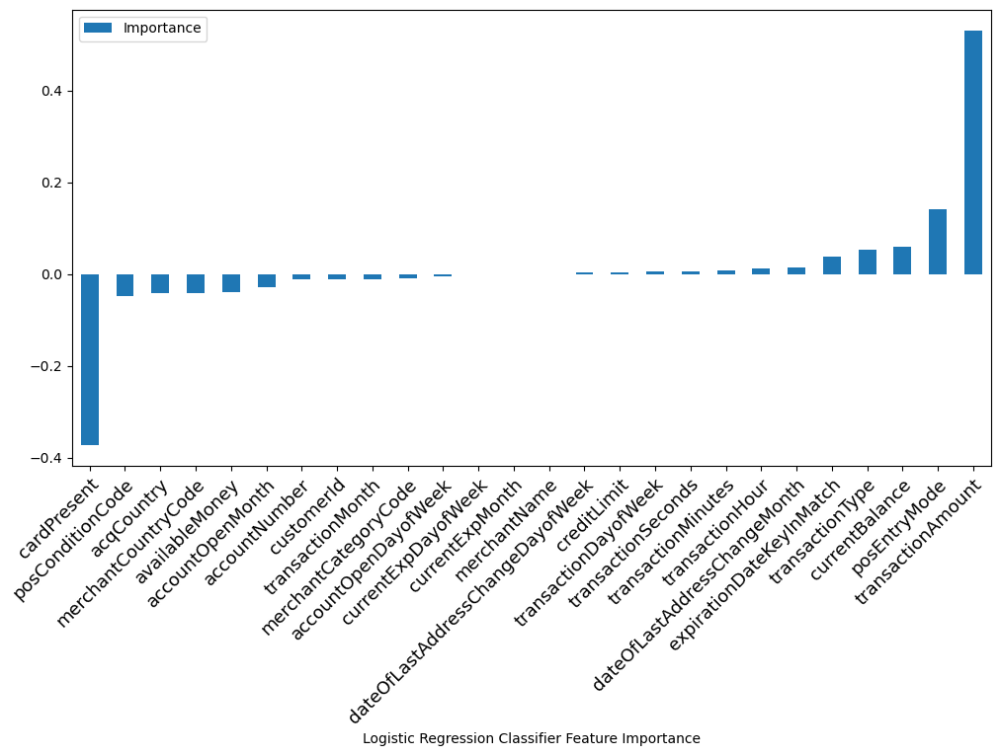

In [50]:
# Plot feature importance for Logistic Regression
logreg_model = train_logistic_regression_classifier(X_train_oversample, y_train_oversample)
# get importance for logistic regression
log_model_importance = pd.DataFrame(
    logreg_model.coef_[0], index=X_train_oversample.columns, columns=["Importance"]
)
# plot the chart
log_model_importance.sort_values(by="Importance").plot(kind="bar", figsize=(12, 6))
plt.xticks(rotation=45, ha="right", rotation_mode="anchor", fontsize=13)
plt.xlabel("Logistic Regression Classifier Feature Importance")
plt.show()

#### Decision Tree Classifier

In [51]:
%%time
# hyperparameter optimization for Decision tree classifier

# define hyperparameters to tune
grid_dt = {
    "criterion" : ["gini", "entropy"],
    "max_depth" : [None, 2, 4, 8, 10, 12],
    "min_samples_split" : [2, 4, 8, 16],
    "min_samples_leaf" : [2, 4, 6]
}
kfold = StratifiedKFold(n_splits=3, shuffle=True, random_state=42)

# define the model 
dt_clf = DecisionTreeClassifier(random_state = 12345)
# define the grid search
grid_search_dt = GridSearchCV(estimator=dt_clf, 
                              param_grid = grid_dt, 
                              cv = kfold, 
                              scoring = 'roc_auc')
# execute search
dt_cv = grid_search_dt.fit(X_train_oversample, y_train_oversample)
# summarize result
print('The best hyperparameters are: {}'.format(dt_cv.best_params_))

In [ ]:
# train the model
def train_decision_tree_classifier(X_train, y_train):
    """This function trains a Decision Tree classifier"""
    # build the model
    dt_model = DecisionTreeClassifier(**grid_search_dt.best_params_)
    dt_model.fit(X_train, y_train) # train the model 
    return dt_model
    
def decision_tree_classifier_prediction(X_train, y_train, X_test, y_test):
    """
    This function is used to make prediction 
    using the Decsion Tree classifier
    """
    dt_model = train_decision_tree_classifier(X_train, y_train)
    dt_pred = dt_model.predict(X_test)
    dt_pred_proba = dt_model.predict_proba(X_test)[:, 1]
    return dt_pred, dt_pred_proba

In [ ]:
# train classifier and make prediction
dt_pred = decision_tree_classifier_prediction(X_train_oversample, y_train_oversample, X_test, y_test)

# get predictions
get_scores(y_test, dt_pred, "Decision Tree")

Measure model performance using Decision Tree Classifier
ROC-AUC Score: 0.562
Log loss is: 0.975
F1 score: 0.972


In [ ]:
# Plot feature importance for Decision Tree
dt_model = train_decision_tree_classifier(X_train_oversample, y_train_oversample)
shap_feature_importance("Decision Tree", dt_model, X_train_oversample)

NameError: name 'train_decision_tree_classifier' is not defined

#### Random Forest Classifier

In [ ]:
%%time
# hyperparameter optimization

# define hyperparameters to tune
grid_rf = {
    "n_estimators" : [10, 25, 50, 100],
    "max_depth" : [2, 4, 8, 10, 12],
    "min_samples_leaf" : [2, 4, 6]
}
kfold = StratifiedKFold(n_splits=3, shuffle=True, random_state=42)

# define the model 
rf_clf = RandomForestClassifier(random_state = 12345)
# define the grid search
grid_search_rf = GridSearchCV(estimator=rf_clf, 
                              param_grid = grid_rf, 
                              cv=kfold, 
                              scoring = 'roc_auc')
# execute search
rf_cv = grid_search_rf.fit(X_train_oversample, y_train_oversample)
# summarize result
print('The best hyperparameters are: {}'.format(rf_cv.best_params_))

The best hyperparameters are: {'max_depth': None, 'n_estimators': 100}
CPU times: user 2h 7min 32s, sys: 51.6 s, total: 2h 8min 23s
Wall time: 2h 7min 51s


In [ ]:
# train the model
def train_random_forest_classifier(X_train, y_train):
    """This function trains a random forest classifier"""
    # build the model
    rf_model = RandomForestClassifier(**grid_search_rf.best_params_)
    rf_model.fit(X_train, y_train) # train the model 
    return rf_model
    
def random_forest_classifier_prediction(X_train, y_train, X_test, y_test):
    """
    This function is used to make prediction 
    using the random forest  model
    """
    rf_model = train_random_forest_classifier(X_train, y_train)
    rf_pred = rf_model.predict(X_test)
    rf_pred_proba = rf_model.predict_proba(X_test)[:, 1]
    return rf_pred, rf_pred_proba

In [ ]:
# train classifier and make prediction
rf_pred = random_forest_classifier_prediction(X_train_oversample, y_train_oversample, X_test, y_test)

# get predictions
get_scores(y_test, rf_pred, "Random Forest")

CPU times: user 7min 19s, sys: 999 ms, total: 7min 20s
Wall time: 7min 19s


AUC-ROC Score and Accuracy using Random Forest Classifier
AUC-ROC Score: 99.37%
Accuracy score: 93.47%

CPU times: user 16.7 s, sys: 44.4 ms, total: 16.7 s
Wall time: 16.7 s


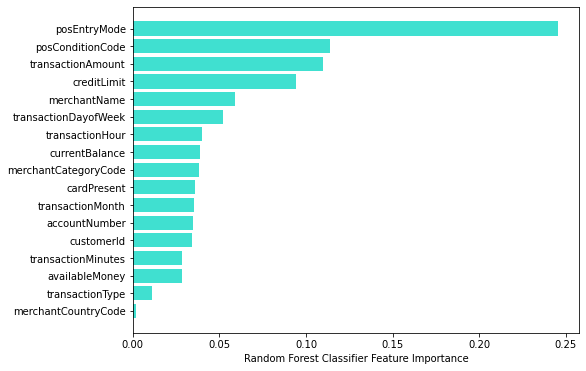

In [ ]:
# Plot feature importance for Random Forest
rf_model = train_random_forest_classifier(X_train_oversample, y_train_oversample)
shap_feature_importance("Random Forest", rf_model, X_train_oversample)

#### XGBoost Classifier

In [ ]:
%%time
# hyperparameter optimization for XGBoost Classifier

# define hyperparameters to tune
grid_xgb = {'learning_rate': [0.01, 0.1, 0.3], 
            'max_depth': [2, 4, 6],
            'n_estimators': [50, 100, 200, 500]
           }
kfold = StratifiedKFold(n_splits=3, shuffle=True, random_state=42)

# define the model 
xgb_model = XGBClassifier(random_state = 12345, verbosity = 0)
# define the grid search
grid_search_xgb = GridSearchCV(
    estimator = xgb_model, 
    param_grid = grid_xgb, 
    scoring = "roc_auc", 
    cv = kfold, 
    n_jobs = 1
)
# execute search
xgb_cv = grid_search_xgb.fit(X_train_oversample, y_train_oversample)
# summarize result
print('The best hyperparameters are: {}'.format(xgb_cv.best_params_))

The best hyperparameters are: {'max_depth': 10, 'n_estimators': 200}
CPU times: user 3h 31min 9s, sys: 23.6 s, total: 3h 31min 32s
Wall time: 3h 30min 36s


In [ ]:
# train the model
def train_xgboost_classifier(X_train, y_train):
    """This function trains an XGBoost classifier"""
    # build the model
    xgb_model = XGBClassifier(**grid_search_xgb.best_params_)
    xgb_model.fit(X_train, y_train) # train the model 
    return xgb_model
    
def xgboost_classifier_prediction(X_train, y_train, X_test, y_test):
    """
    This function is used to make prediction 
    using the XGBoost classifier model
    """
    xgb_model = train_xgboost_classifier(X_train, y_train)
    xgb_pred = xgb_model.predict(X_test)
    xgb_pred_proba = xgb_model.predict_proba(X_test)[:, 1]
    return xgb_pred, xgb_pred_proba

In [ ]:
# train classifier and make prediction
model_pred = xgboost_classifier_prediction(X_train_oversample, y_train_oversample, X_test, y_test)

# get predictions
get_scores(y_test, model_pred, "XGBoost")

CPU times: user 14min 45s, sys: 1.24 s, total: 14min 46s
Wall time: 14min 42s


AUC-ROC Score and Accuracy using XGBoost Classifier
AUC-ROC Score: 99.73%
Accuracy score: 99.18%

CPU times: user 15.2 s, sys: 22.8 ms, total: 15.2 s
Wall time: 15.2 s


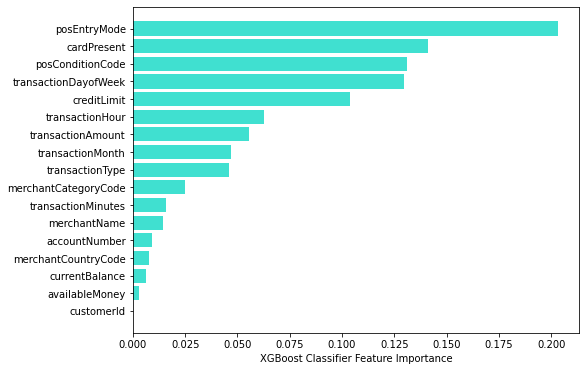

In [ ]:
# Plot feature importance for XGBoost
xgb_model = train_xgboost_classifier(X_train_oversample, y_train_oversample)
shap_feature_importance("XGBoost", xgb_model, X_train_oversample)

#### LightGBM Classifier

In [ ]:
%%time
# hyperparameter optimization for LightGBM classifier

# define hyperparameters to tune
grid_lgbm = {'learning_rate': [0.001, 0.01, 0.05, 0.1],
             'n_estimators': [50, 100, 200],
             'num_leaves': [5, 10, 20, 31],
             'verbose': [0]
            }
kfold = StratifiedKFold(n_splits=3, shuffle=True, random_state=42)

# define the model 
lgbm_clf = LGBMClassifier(random_state = 12345) #, verbosity = 0)
# define the grid search
grid_search_lgbm = GridSearchCV(
    estimator = lgbm_clf, 
    param_grid = grid_lgbm, 
    scoring = 'roc_auc', 
    cv = kfold, 
    n_jobs = 1
)
# execute search
lgbm_cv = grid_search_lgbm.fit(X_train_oversample, y_train_oversample)
# summarize result
print('The best hyperparameters are: {}'.format(lgbm_cv.best_params_))

The best hyperparameters are: {'learning_rate': 0.05, 'n_estimators': 200, 'num_leaves': 31}
CPU times: user 1h 5min 22s, sys: 12.4 s, total: 1h 5min 34s
Wall time: 1h 5min 24s


In [ ]:
# train the model
def train_lightgbm_classifier(X_train, y_train):
    """This function trains a LightGBM classifier"""
    # build the model
    lgbm_model = LGBMClassifier(**grid_search_lgbm.best_params_)
    lgbm_model.fit(X_train, y_train) # train the model 
    return lgbm_model
    
def lightgbm_classifier_prediction(X_train, y_train, X_test, y_test):
    """
    This function is used to make prediction 
    using the LightGBM classifier model
    """
    lgbm_model = train_lightgbm_classifier(X_train, y_train)
    lgbm_pred = lgbm_model.predict(X_test)
    lgbm_pred_proba = lgbm_model.predict_proba(X_test)[:, 1]
    return lgbm_pred, lgbm_pred_proba

In [ ]:
# train classifier and make prediction
lgbm_pred = lightgbm_classifier_prediction(X_train_oversample, y_train_oversample, X_test, y_test)

# get predictions
get_scores(y_test, lgbm_pred, "LightGBM")

CPU times: user 38.8 s, sys: 94.5 ms, total: 38.9 s
Wall time: 38.7 s


AUC-ROC Score and Accuracy using LightGBM Classifier
AUC-ROC Score: 99.67%
Accuracy score: 99.03%

CPU times: user 11.9 s, sys: 15 ms, total: 11.9 s
Wall time: 11.8 s


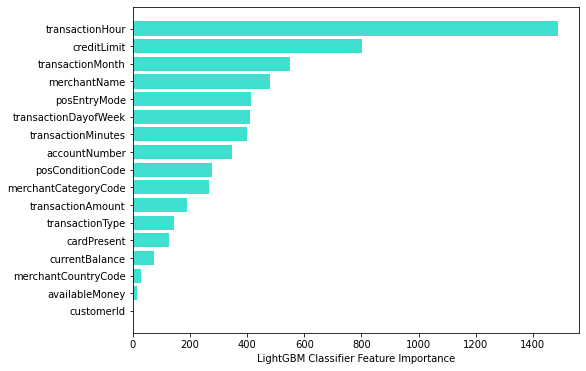

In [ ]:
# Plot feature importance for LightGBM
lgbm_model = train_lightgbm_classifier(X_train_oversample, y_train_oversample)
shap_feature_importance("LightGBM", lgbm_model, X_train_oversample)

#### CatBoost Classifier

In [ ]:
# let's balance classes for the CatBoost
 
# create features and target
X = card_transactions_catBoost.drop(['isFraud'], axis = 1)
y = card_transactions_catBoost.isFraud

# split data into training and testing sets
X_train_cb, X_test_cb, y_train_cb, y_test_cb = train_test_split(X, y, test_size=0.20, random_state=12345)

# split train data into validation and train 
X_train_cb, X_valid_cb, y_train_cb, y_valid_cb = train_test_split(X_train_cb, y_train_cb, test_size = 0.25, random_state = 12345) # 0.25 * 0.80 = 0.20 for validation size

# resample training data for catboost
categorical_cols = [cname for cname in X_train_cb.columns if X_train_cb[cname].dtype == 'object']  # categorical columns 
# categorical_column_index = [X_train_cb.columns.get_loc(c) for c in categorical_cols if c in X_train_cb] # categorical column index

X_train_cb, y_train_cb = oversample.fit_resample(X_train_cb, y_train_cb)


# display the shape of the split dataset for CatBoost method
print('The train set now contains {}'.format(X_train_cb.shape[0]) + ' dataset representing 60% of the data') 
print('The valid set now contains {}'.format(X_valid_cb.shape[0]) + ' dataset representing 20% of the data')
print('The test set now contains {}'.format(X_test_cb.shape[0]) + ' dataset representing 20% of the data')

In [ ]:
%%time
# hyperparameter optimization for catboost

# define hyperparameters to tune
grid_cb = {'learning_rate': [0.001, 0.01, 0.5],
        'depth': [4, 6, 10],
        'l2_leaf_reg': [1, 3, 5, 7, 9]
       }
kfold = StratifiedKFold(n_splits=3, shuffle=True, random_state=42)

# define the model 
catboost_clf = CatBoostClassifier(
    iterations=200,
    cat_features = categorical_cols,
    logging_level = 'Silent',
    eval_metric='AUC',
    early_stopping_rounds = 50,
    random_state = 12345)
# define the grid search
grid_search_cb = GridSearchCV(estimator = catboost_clf, param_grid = grid_cb, scoring="roc_auc", cv=kfold)
# execute search
catboost_cv = grid_search_cb.fit(X_train_cb, y_train_cb)
# summarize result
print('The best hyperparameters are: {}'.format(catboost_cv.best_params_))

In [ ]:
# function to train model and make predictions
def train_catboost_classifier(X_train, y_train, X_test, y_test):
    """This function trains a catboost classifier model"""
    # build the model
    cb_model = CatBoostClassifier(**grid_search_cb.best_params_)
    cb_model.fit(X_train, y_train, cat_features = categorical_cols, eval_set=(X_test, y_test), verbose=False, plot=False) # train the model 
    return cb_model
    
def catboost_classifier_prediction(X_train, y_train, X_test, y_test):
    """
    This function is used to make prediction 
    using the catboost classifier model
    """
    cb_model = train_catboost_classifier(X_train, y_train, X_test, y_test)
    cb_pred = cb_model.predict(X_test)
    cb_pred_proba = cb_model.predict_proba(X_test)[:, 1]
    return cb_pred, cb_pred_proba


In [ ]:
# train classifier and make prediction
cb_pred = catboost_classifier_prediction(X_train_cb, y_train_cb, X_test_cb, y_test_cb)

# get predictions
get_scores(y_test_cb, cb_pred, "CatBoost")

In [ ]:
# Plot feature importance for Catboost classifier
cb_model = train_catboost_classifier(X_train_cb, y_train_cb, X_test_cb, y_test_cb)
shap_feature_importance("CatBoost", cb_model, X_train_cb)

#### Conclusion

We tuned, trained and made predictions using six models. The LightGBM seems to be the fastest algorithm. We chose the XGBoost as the best performing model and use it for testing the test dataset.

<div id="model_analysis">
    <h2>Model Analysis</h2> 
</div>

#### Conclusion

Here, different classification models were trained and tested. A summary of the models, their respective AUC-ROC and accuracy score, the time it took to train and test the model is shown below. The best model that performed well on the training dataset is the XGBoost classifier. We used the result from this model as our final model.

|Models | Hyperparameter tuning time | Training time | Prediction time | AUC-ROC score | Accuracy score|
|:----|:-----:|:-----|:-----|:-----|:-----|
| Dummy Classifier | - | - | - | 50.00 % | 98.43 % |
| Logistic Regression | 15min 46 s | 29.7s | 1.09 s | 69.56 % | 65.03 % |
| Decision Tree Classifier| 1h 2min 19s | 24 s | 266 ms | 95.60 % | 94.72 % |
| Random Forest Classifier | 1h 54min 22s | 6min 52s | 16 s | 99.39 % | 93.61 % |
| CatBoost Classifier | 21min 11s | 15.4 s | 67.9 ms | 91.99 % | 88.13 % |
| XGBoost Classifier  | 4min 16s | 851 ms | 161 ms | 91.01 % | 87.90 % |
| LightGBM Classifier | 54.5 s | 163 ms | 101 ms | 91.37 % | 87.79 % |

Here we choose the best model that performs best on the training dataset. We would be analyzing the speed and quality of the trained models.

In [ ]:
# determine best algorithm
models = {'LogisticRegression':logreg_cv.best_score_,
          'DecisionTree':dt_cv.best_score_,
          'RandomForest':rf_cv.best_score_,
          'XGBoost': xgb_cv.best_score_,
          'LightGBM': lgbm_cv.best_score_,
          'CatBoost': catboost_cv.best_score_
         }

bestalgorithm = max(models, key=models.get)
print('Best model is', bestalgorithm,'with a score of', models[bestalgorithm])
if bestalgorithm == 'LogisticRegression':
    print('Best params is :', logreg_cv.best_params_)
if bestalgorithm == 'DecisionTree':
    print('Best params is :', dt_cv.best_params_)
if bestalgorithm == 'RandomForest':
    print('Best params is :', rf_cv.best_params_)
if bestalgorithm == 'XGBoost':
    print('Best params is :', xgb_cv.best_params_)
if bestalgorithm == 'LightGBM':
    print('Best params is :', lgbm_cv.best_params_)
if bestalgorithm == 'CatBoost':
    print('Best params is :', catboost_cv.best_params_)

#### ROC Curve for Classification Models

In [ ]:
# Fit multiple models and plot AUC ROC curve for binary classification
def plot_roc_curve(models, X_train, y_train, X_test, y_test):
    plt.figure(figsize=(8, 6))  # Set the size of the plot

    for name, model in models.items():
        model.fit(X_train, y_train)
        y_pred_proba = model.predict_proba(X_test)[:, 1]

        # Compute the ROC curve and AUC for binary classification
        fpr, tpr, _ = roc_curve(y_test, y_pred_proba)
        roc_auc = auc(fpr, tpr)

        plt.plot(fpr, tpr, label=f"{name}, AUC = {roc_auc:.4f}")

    # Plot the random classifier line
    plt.plot([0, 1], [0, 1], 'k--', label='Random', linewidth=2)
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic (ROC) Curve for Binary Classification')
    plt.legend(loc="lower right")
    plt.grid(True)
    plt.show()

# Define the model dictionary
models = {
    "Logistic regression": logreg_model,
    "Random Forest": rf_model,
    "Decision Tree": dt_model,
    "XGBoost": xgb_model,
    "LightGBM": lgbm_model,
    "CatBoost": cb_model
}

# Call the plot_roc_curve function with encoded class labels
plot_roc_curve(models, X_train_oversample, y_train_oversample, X_test, y_test)

<div id="model_testing">
    <h2>Model Testing</h2> 
</div>

The LightGBM classifier is chosen as the model for the final testing for this task because of it has the lowest tuning and prediction time. Using this best performing model, we evaluate on the test dataset.

In [ ]:
# Make prediction with LightGBM
lgbm_pred = lightgbm_classifier_prediction(X_train_oversample, y_train_oversample, X_test, y_test)

# get predictions
get_scores(y_test, lgbm_pred, "LightGBM")

In [ ]:
# Plot Confusion Matrix
plot_confusion_matrix(y_test, lgbm_pred[0])

#### Conclusion

The logistic regression algorithm had one of the fastest training time but had the worst AUC-ROC and accuracy score of 69.82% and 65.62% respectively. The decision tree algorithm had an excellent AUC-ROC score and accuracy score of 95.14% and 94.39% respectively. We encountered significant problems completing the run of the other model due to computational restrictions. We crashed our computing resources countless times over the weekend in the process of trying to tune effectively and train the model. We believe that if computational resources was not a constrain, we would be able to complete each run and suggest the best model for this data. 

If computational resources is not a problem and CapitalOne has enough time to push a model to production, then the CatBoost or XGBoost algorithm should be used. But if CapitalOne really wants to push a model fast to production, then the LightGBM regressor should be used since tuning, training and testing on the LightGBM is extremely fast and model result is pretty decent. The top features that influences the decision tree classifier are the `posEntryMode`, `creditLimit`, `posConditionCode`, `transactionAmount`, and `transactionDayofWeek`. 

<div id="overall_conclusion">
    <h2>Overall Conclusion</h2> 
</div>